# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17088, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 17088 (delta 22), reused 5 (delta 5), pack-reused 17051 (from 4)
Receiving objects: 100% (17088/17088), 15.71 MiB | 6.82 MiB/s, done.
Resolving deltas: 100% (11723/11723), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 905.3/905.3 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.1 MB/s eta 0:00:00
Setup complete. Using torch 2.5.1+cu121 (Tesla T4)


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="zFd3QVsbAnxy8DxpN8UU")
project = rf.workspace("dip-project-bvluv").project("varroa-detection-demo")
version = project.version(1)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/varroa-detection-demo-1 in yolov5pytorch:: 100%|██████████| 1980/1980 [00:00<00:00, 6414.23it/s]


Train mô hình với yolov5

In [ ]:
!python train.py --img 416 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
       5/49      1.95G    0.04928    0.01887   0.002692         60        416:  89% 48/54 [00:08<00:01,  4.22it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       5/49      1.95G     0.0493    0.01888   0.002683         67        416:  91% 49/54 [00:08<00:01,  3.69it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       5/49      1.95G    0.04919    0.01886   0.002672         59        416:  93% 50/54 [00:08<00:01,  3.94it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       5/49      1.95G    0.049

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
chạy quá trình phát hiện đối tượng (inference) bằng mô hình YOLOv5 đã được huấn luyện trước đó của bạn trên một tập hợp các ảnh kiểm tra.


In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/varroa-detection-demo-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-392-gf003c3df Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/42 /content/datasets/varroa-detection-demo-1/test/images/2017-08-28_09-30-00-1_500_dirty_glass-mp4-bee_id_6725-4290-1_png.rf.200340be29b9508fb7b597fef7a09582.jpg: 416x416 1 bee, 7.1ms
image 2/42 /content/datasets/varroa-detection-demo-1/test/images/2017-08-28_09-30-00-1_50

Hiển thị các ảnh của kết quả suy luận được lưu trữ trong đường dẫn

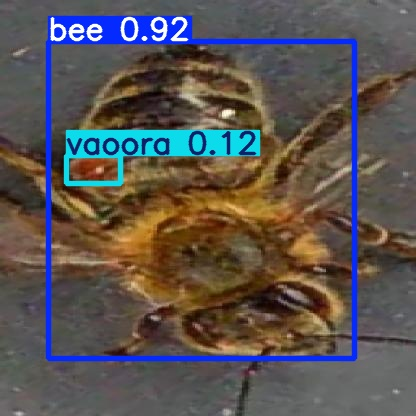

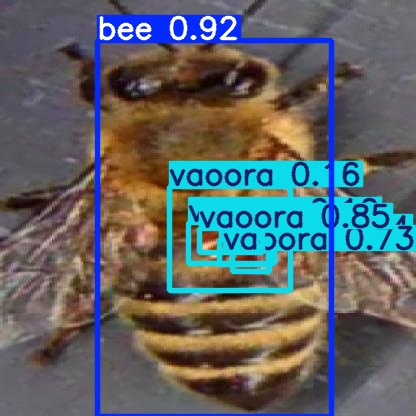

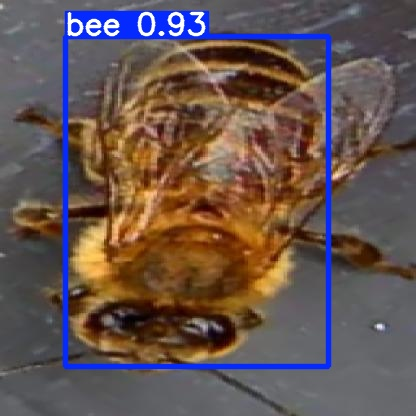

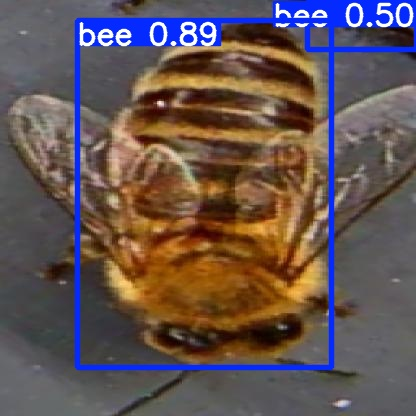

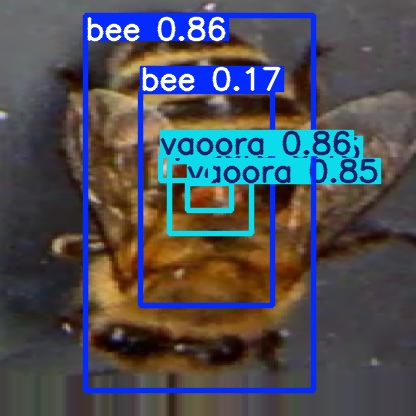

...

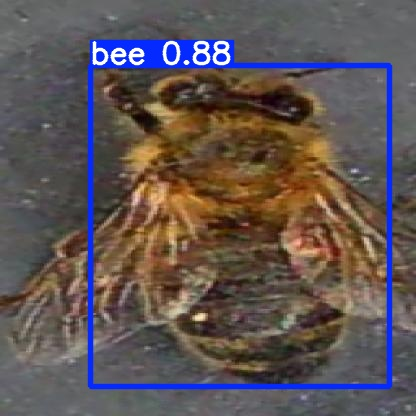

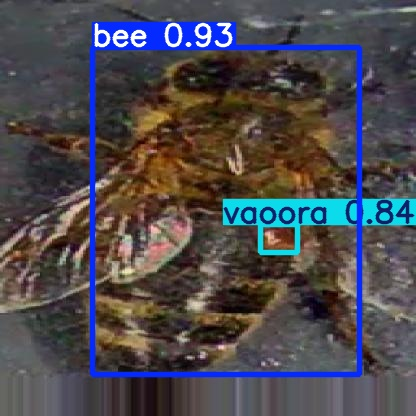

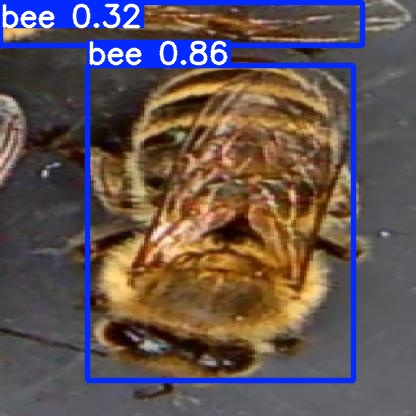

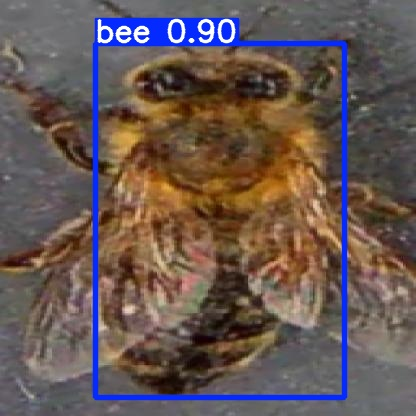

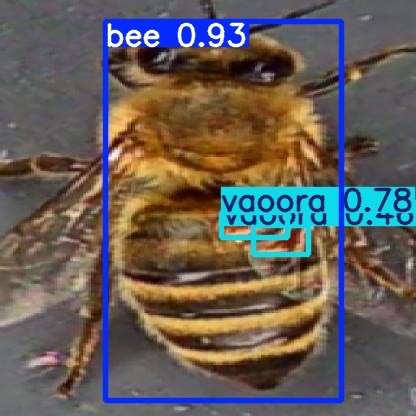

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps
chạy phát hiện vật thể với model đã được train sẵn .
tải leen file vào thư mục sample_data và đặt tên file muốn check là 'checkfile2.png' hoặc sửa tên checkfile2 trong code thành tên tệp tải lên để model nhận dạng bức ảnh bạn đưa vào có Varroa hay không

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/sample_data/checkfile.png, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-392-gf003c3df Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/sample_data/checkfile.png: 416x256 1 bee, 2 vaooras, 37.5ms
Speed: 0.3ms pre-process, 37.5ms inference, 676.7ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp
2 labels saved to runs/detect/exp/labels


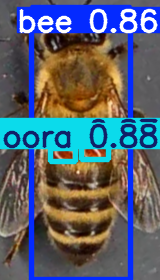

In [ ]:
# Run inference, saving output to a specific file
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/sample_data/checkfile.png --save-txt --save-conf --exist-ok

# Define the output image path
output_image_path = '/content/yolov5/runs/detect/exp/checkfile.png'

# Display the output image
from IPython.display import Image, display
display(Image(filename=output_image_path))
print("\n")